In [2]:
import tensorflow as tf
import pandas as pd
import pathlib
import os
import matplotlib.pyplot as plt
import numpy as np
import csv
import scipy.interpolate as interp
import keras 
from keras import layers
import hickle as hkl
from keras.callbacks import History 
history = History()
import time

In [3]:
#load all models
dataset = hkl.load('datasetshort.hkl')[0:5]
modelv2 = keras.models.load_model('model_v2.h5')
modelv4 = keras.models.load_model('model_v4.h5')
modelv5 = keras.models.load_model('model_v5.h5')
modelv6 = keras.models.load_model('model_v6.h5')
modelv7 = keras.models.load_model('model_v7.h5')
modelv8 = keras.models.load_model('model_v8.h5')

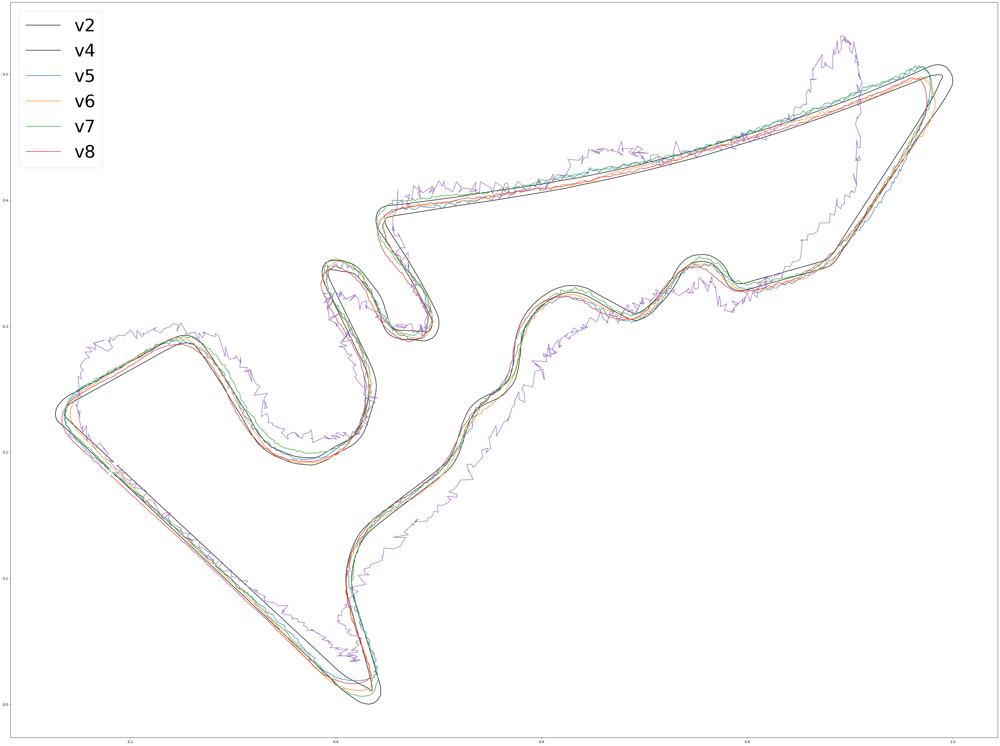

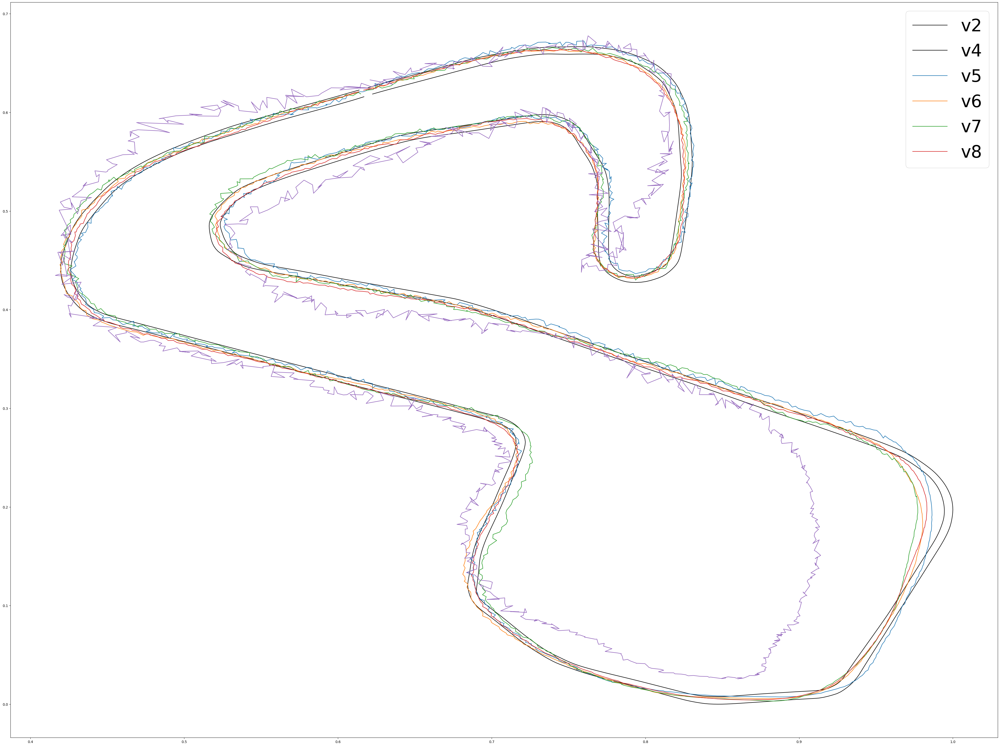

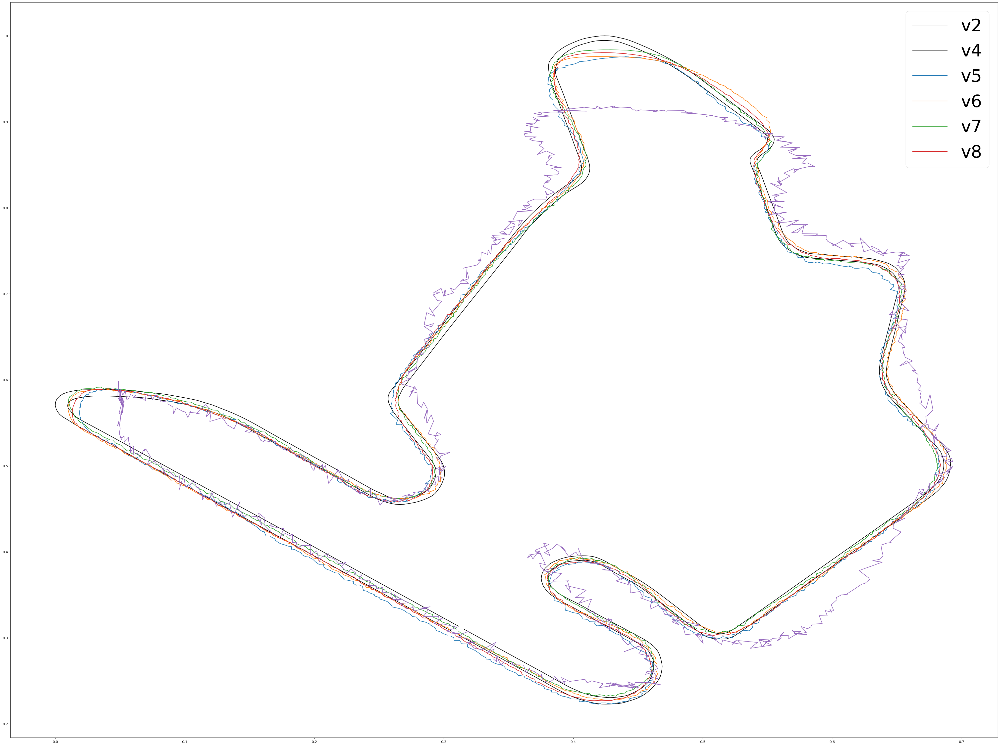

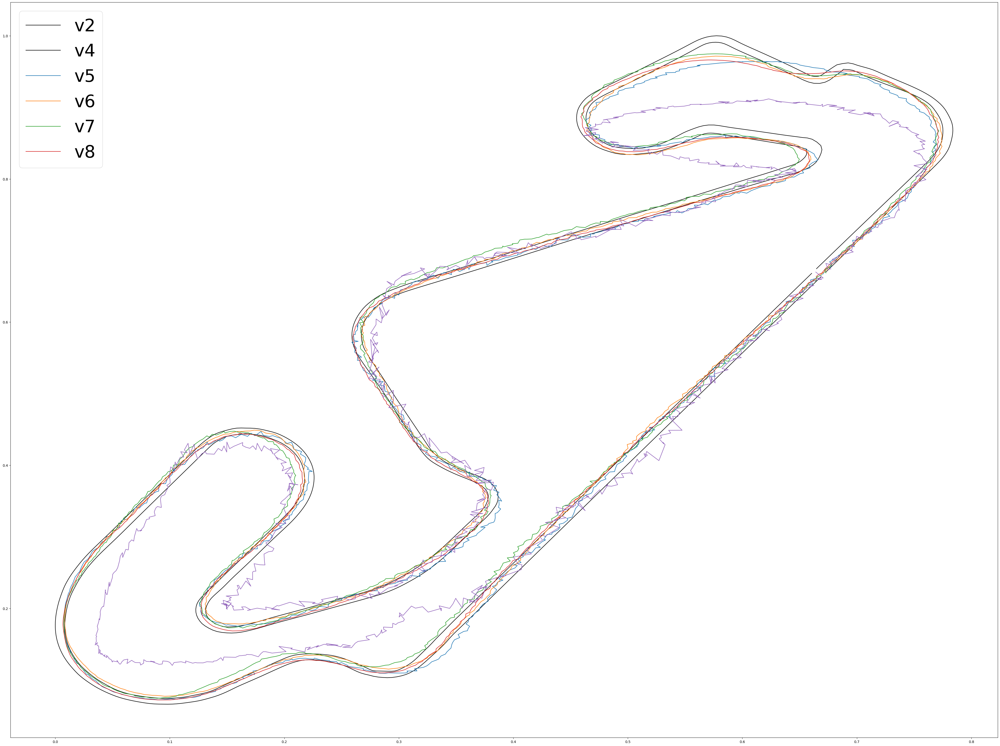

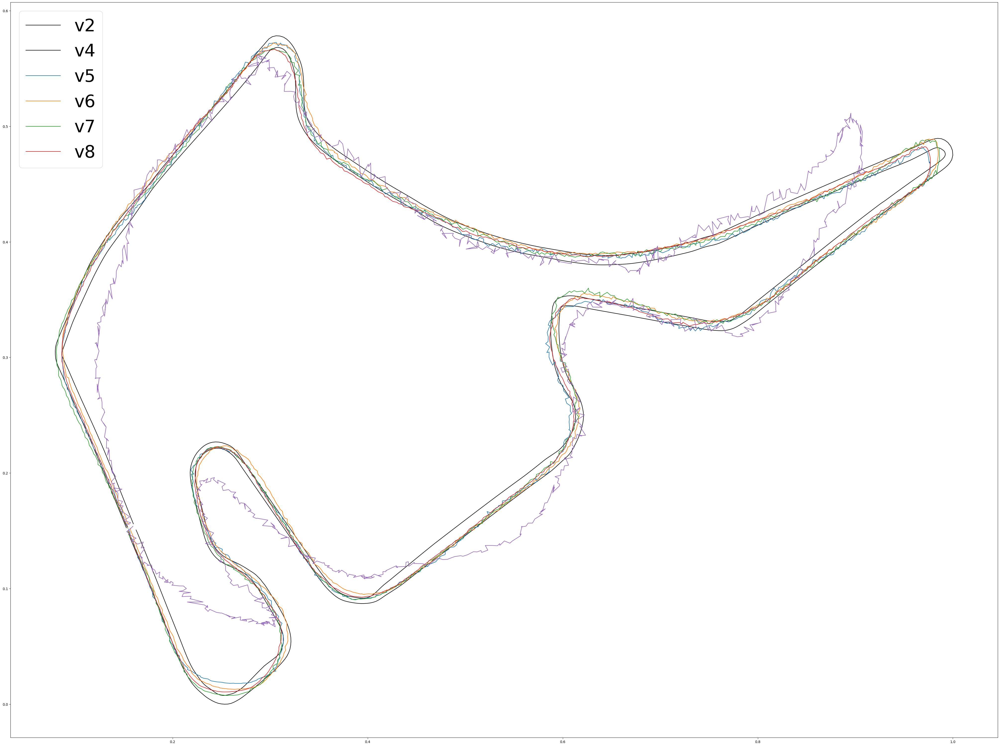

In [7]:
#generate a graoph for 5 different training circuits in order to asess the performance in the training phase
#and overfitting evaluation

for n in [0,1,2,3,4]:
    result = [modelv2(np.array([dataset[n,0:4]])),
              modelv4(np.array([dataset[n,0:4]])),
              modelv5(np.array([dataset[n,0:4]])),
              modelv6(np.array([dataset[n,0:4]])),
              modelv7(np.array([dataset[n,0:4]])),
              modelv8(np.array([dataset[n,0:4]]))]
    plt.figure(figsize=(6.4*8,4.8*8))
    for i in [0,2]:
            plt.plot(dataset[n,i],dataset[n,i+1],color = 'k')
    for j in [0,1,2,3,4]:
        plt.plot(result[j][0][0],result[j][0][1])
    plt.legend(["v2","v4","v5","v6","v7","v8"],fontsize="50")
    plt.savefig('results/circuit'+str(n)+'modeltraining.png')
    #plt.clf()

# ALL 1 CIRCUIT

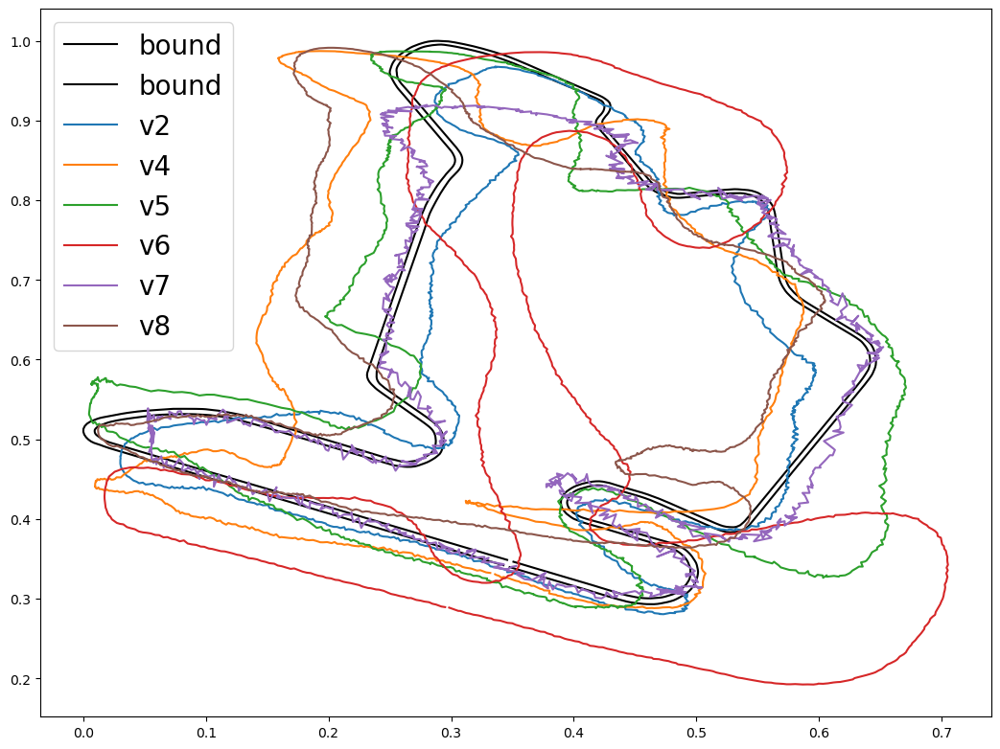

In [4]:
testtracks = hkl.load('testtracks.hkl')[2,0:4,:]
def normalizecircuit(circuit):
    jcircuit = circuit-circuit.min()
    normcircuit = jcircuit/jcircuit.max()
    return normcircuit
testracks = normalizecircuit(testtracks)
result = [modelv2(np.array([testracks])),
              modelv4(np.array([testracks])),
              modelv5(np.array([testracks])),
              modelv6(np.array([testracks])),
              modelv7(np.array([testracks])),
              modelv8(np.array([testracks]))]
plt.figure(figsize=(6.4*2,4.8*2))
for i in [0,2]:
            plt.plot(testracks[i],testracks[i+1],color = 'k')
for j in [0,1,2,3,4,5]:
    plt.plot(result[j][0][0],result[j][0][1])
plt.legend(["bound","bound","v2","v4","v5","v6","v7","v8"],fontsize="20")
    #plt.clf()

# SOME 1 CIRCUIT

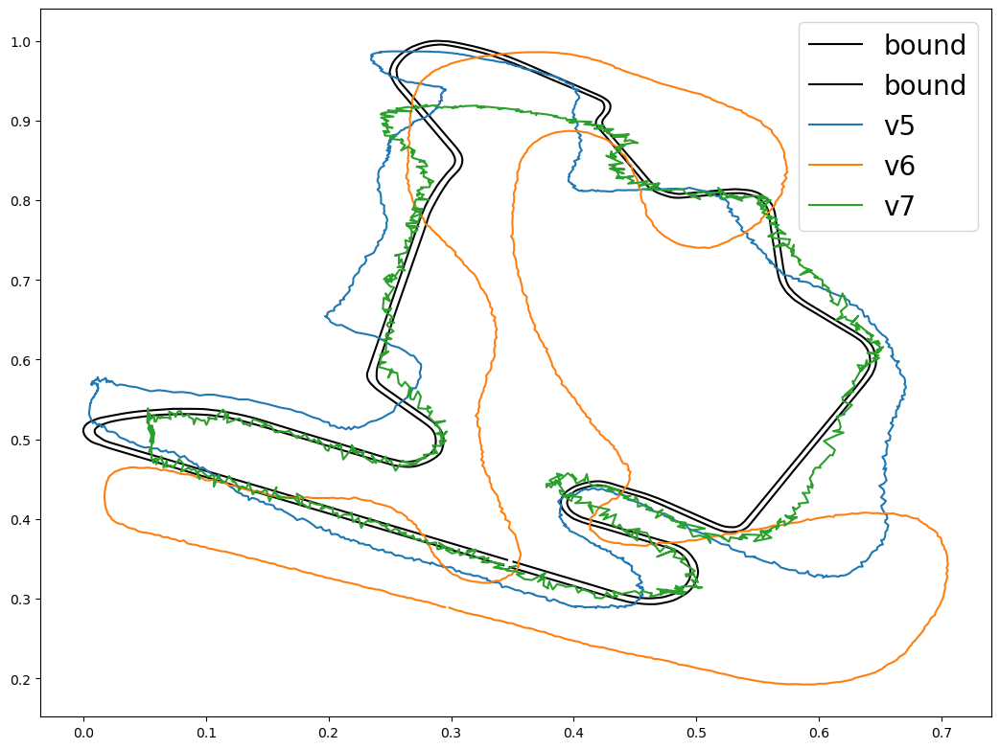

In [5]:
testracks = normalizecircuit(testtracks)
result = [modelv5(np.array([testracks])),
              modelv6(np.array([testracks])),
              modelv7(np.array([testracks]))]
plt.figure(figsize=(6.4*2,4.8*2))
for i in [0,2]:
            plt.plot(testracks[i],testracks[i+1],color = 'k')
for j in [0,1,2]:
    plt.plot(result[j][0][0],result[j][0][1])
plt.legend(["bound","bound","v5","v6","v7"],fontsize="20")
    #plt.clf()

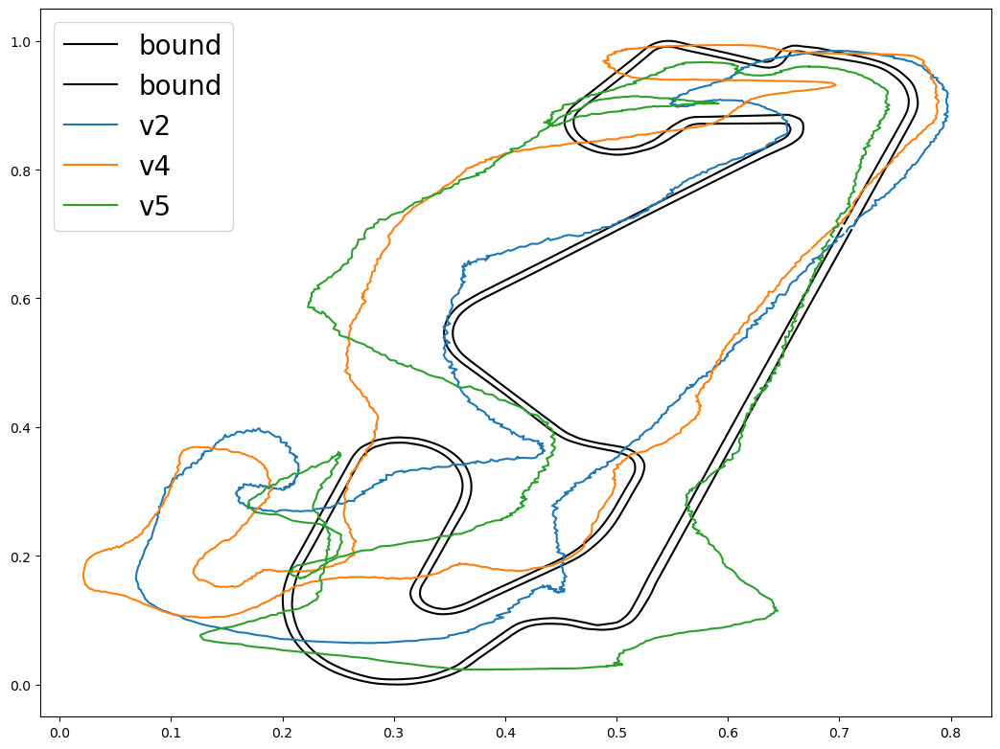

In [10]:
testtracks = hkl.load('testtracks.hkl')[3,0:4,:]
def normalizecircuit(circuit):
    jcircuit = circuit-circuit.min()
    normcircuit = jcircuit/jcircuit.max()
    return normcircuit
testracks = normalizecircuit(testtracks)
result = [modelv2(np.array([testracks])),
              modelv4(np.array([testracks])),
              modelv5(np.array([testracks]))]
plt.figure(figsize=(6.4*2,4.8*2))
for i in [0,2]:
            plt.plot(testracks[i],testracks[i+1],color = 'k')
for j in [0,1,2]:
    plt.plot(result[j][0][0],result[j][0][1])
plt.legend(["bound","bound","v2","v4","v5"],fontsize="20")
    #plt.clf()

(1, 1, 2, 1000)


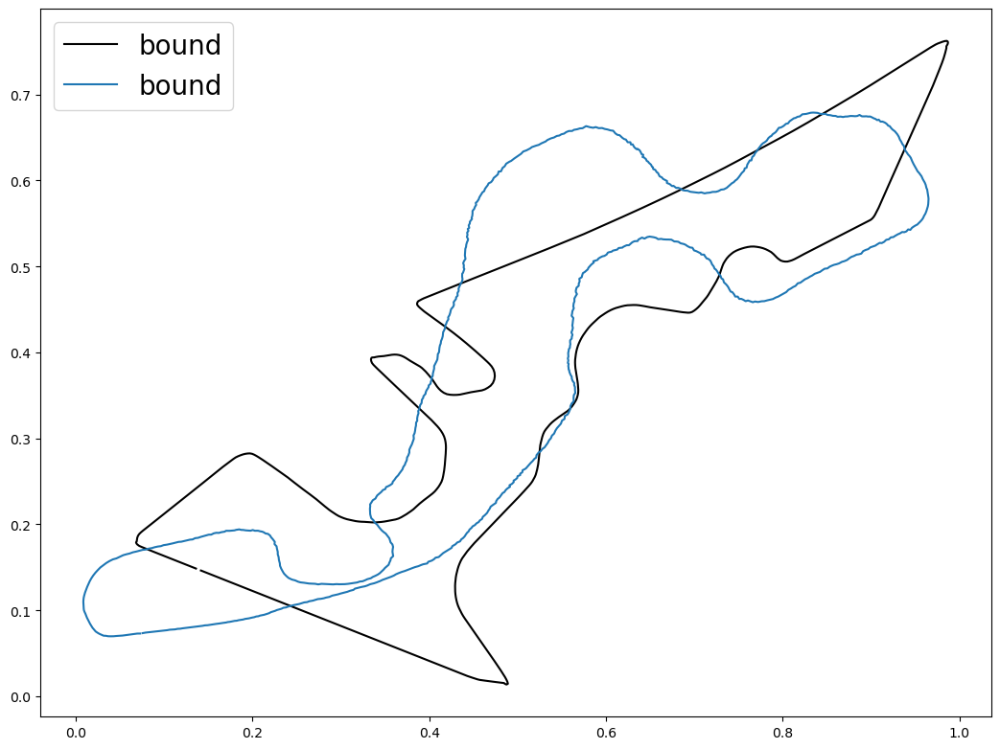

In [27]:
testtracks = hkl.load('testtracks.hkl')[0,0:4,:]
testracks = normalizecircuit(testtracks)
result = modelv6(np.array([testracks])),
plt.figure(figsize=(6.4*2,4.8*2))
print (np.shape(result))

plt.plot(testracks[i],testracks[i+1],color = 'k')
plt.plot(result[0][0][0],result[0][0][1])
plt.legend(["bound","bound","v6","v7"],fontsize="20")
    #plt.clf()

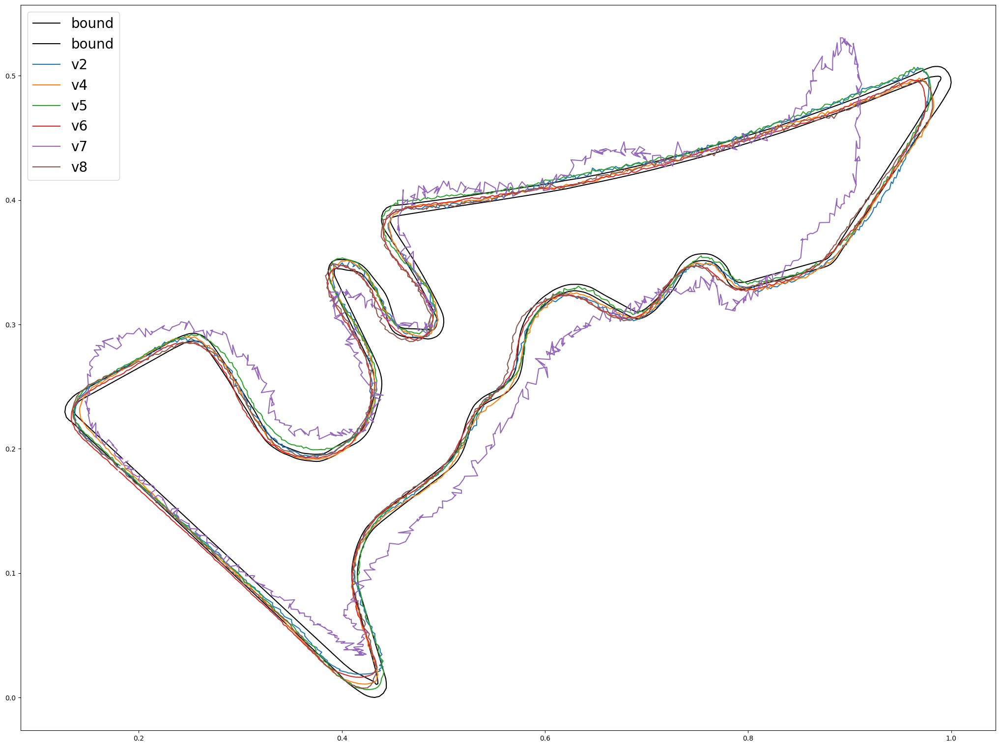

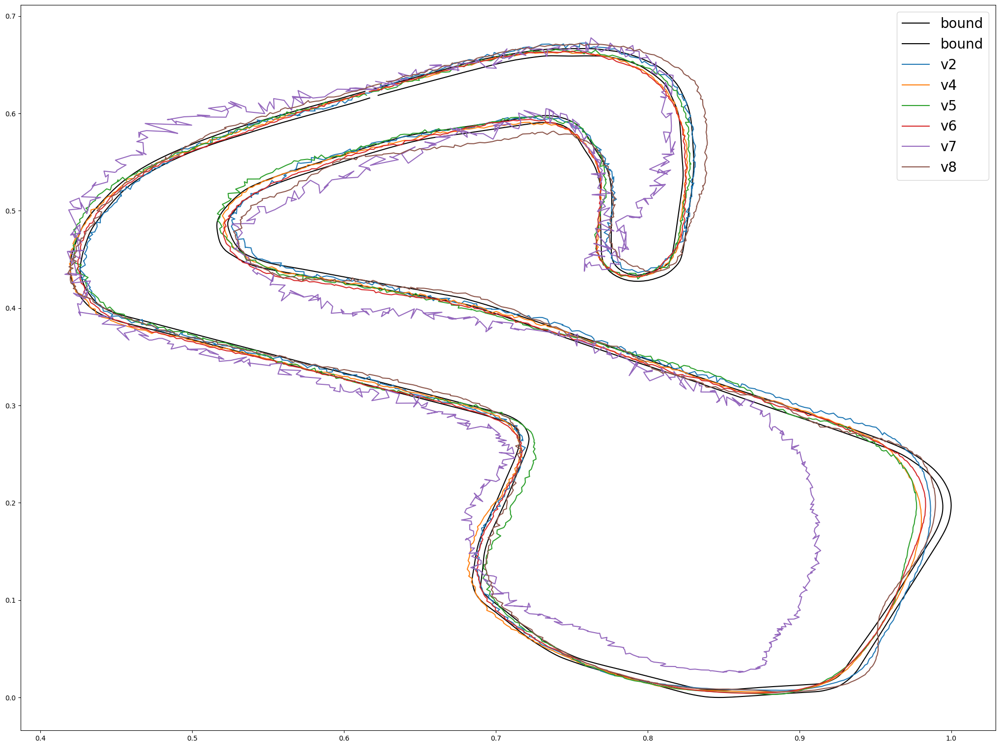

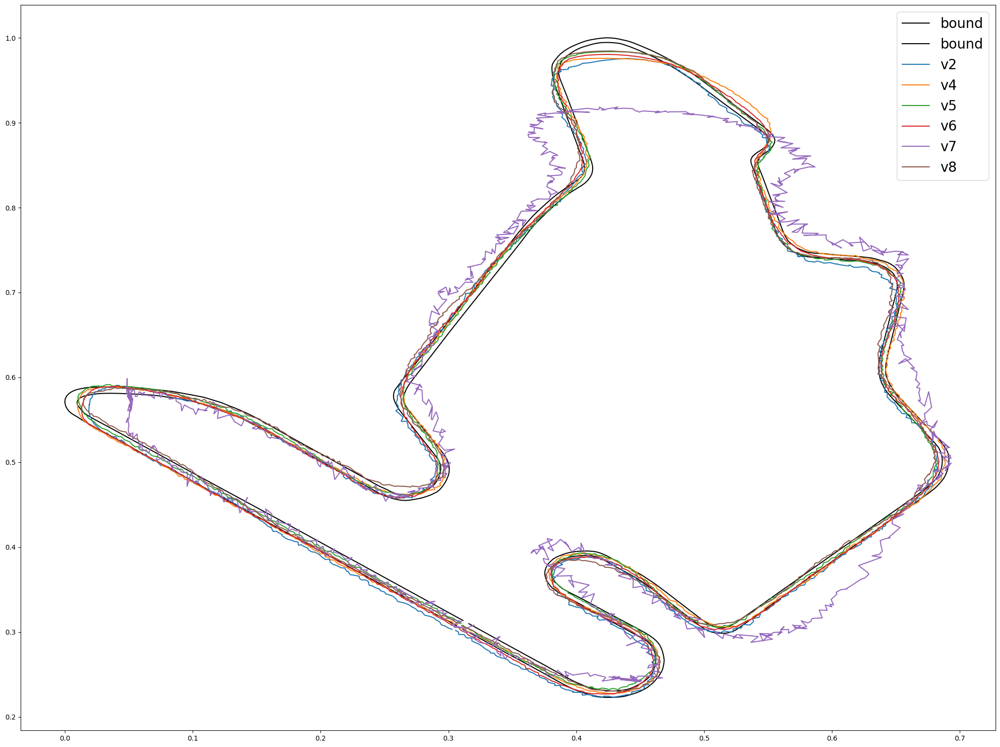

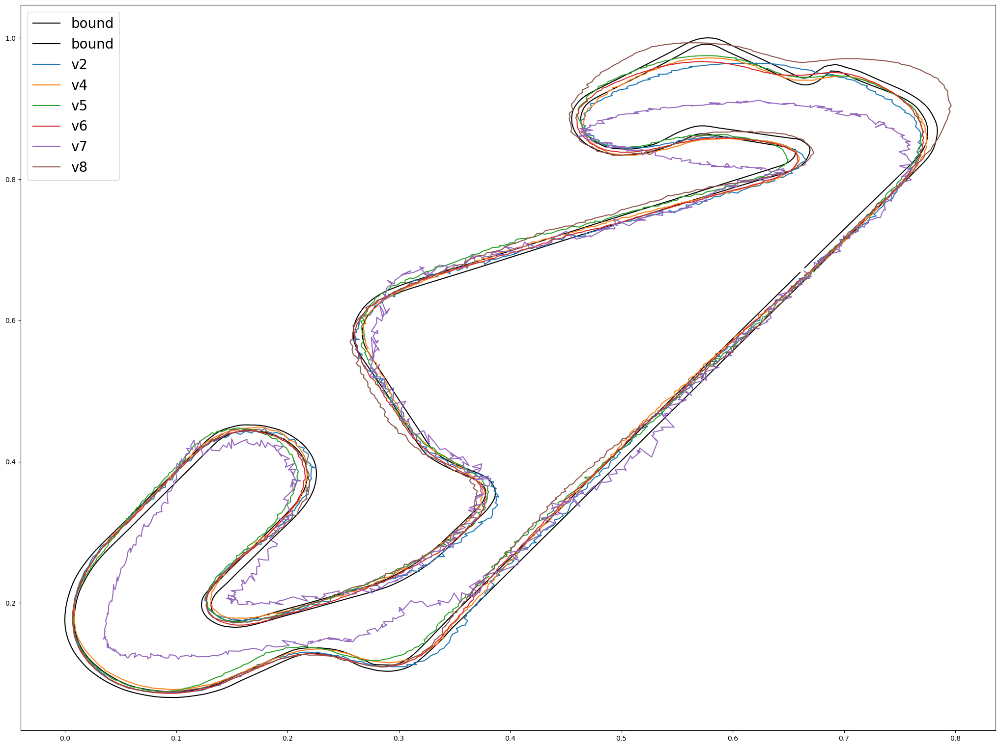

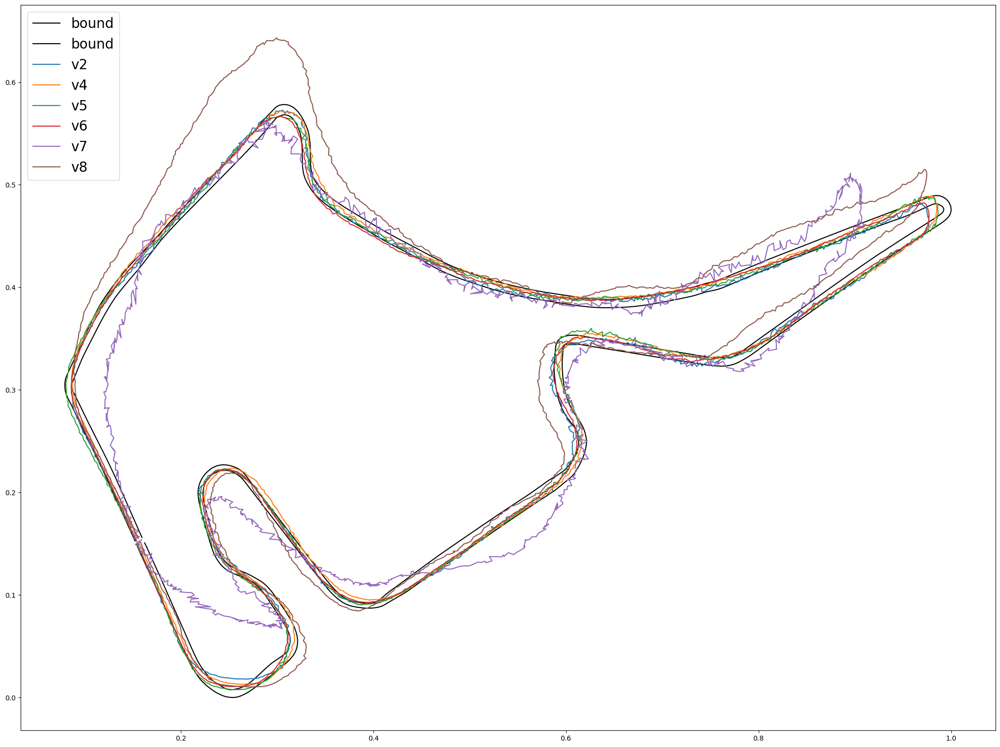

In [31]:
for n in [0,1,2,3,4]:
    result = [modelv2(np.array([dataset[n,0:4]])),
              modelv4(np.array([dataset[n,0:4]])),
              modelv5(np.array([dataset[n,0:4]])),
              modelv6(np.array([dataset[n,0:4]])),
              modelv7(np.array([dataset[n,0:4]])),
              modelv8(np.array([dataset[n,0:4]]))]
    plt.figure(figsize=(6.4*4,4.8*4))
    for i in [0,2]:
            plt.plot(dataset[n,i],dataset[n,i+1],color = 'k')
    for j in [0,1,2,3,4,5]:
        plt.plot(result[j][0][0],result[j][0][1])
    plt.legend(["bound","bound","v2","v4","v5","v6","v7","v8"],fontsize="20")
    #plt.clf()

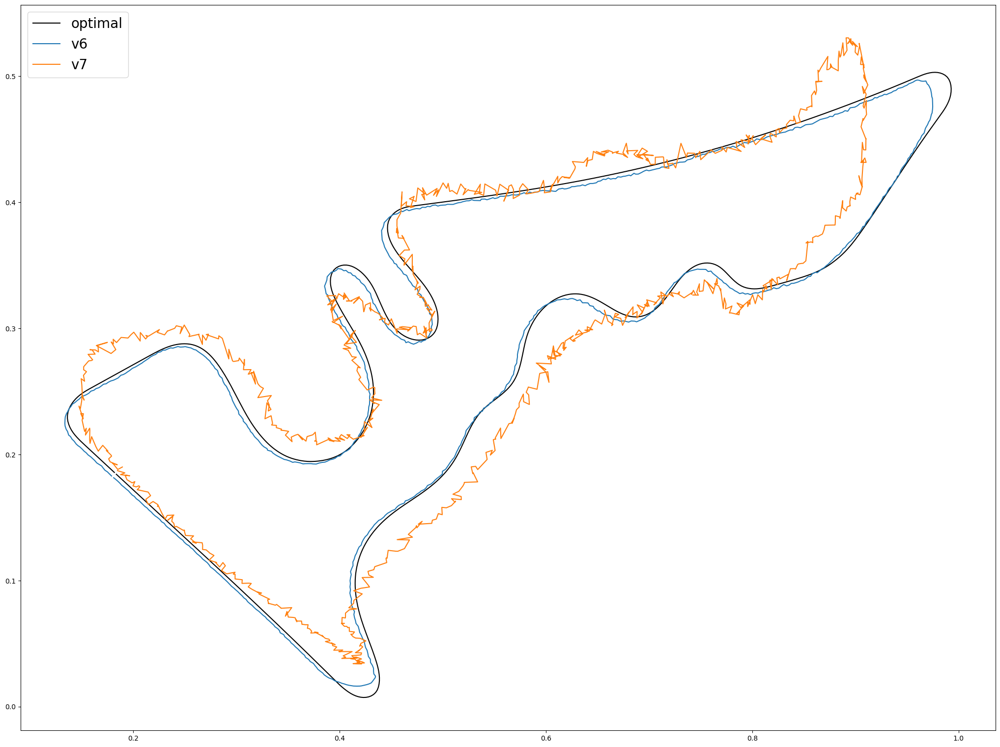

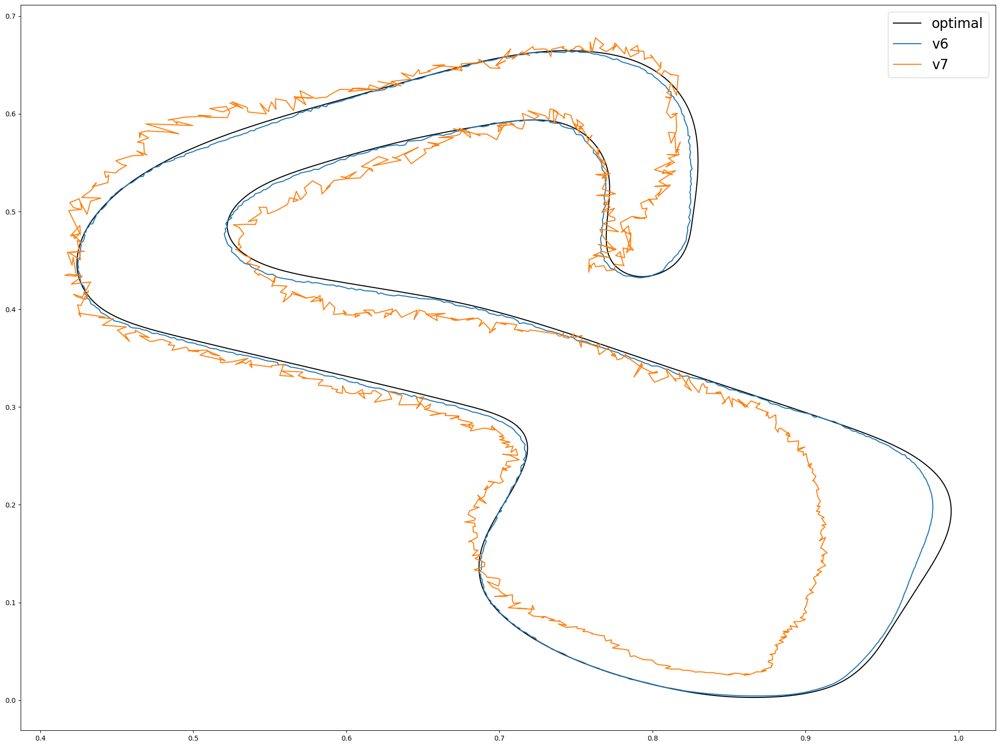

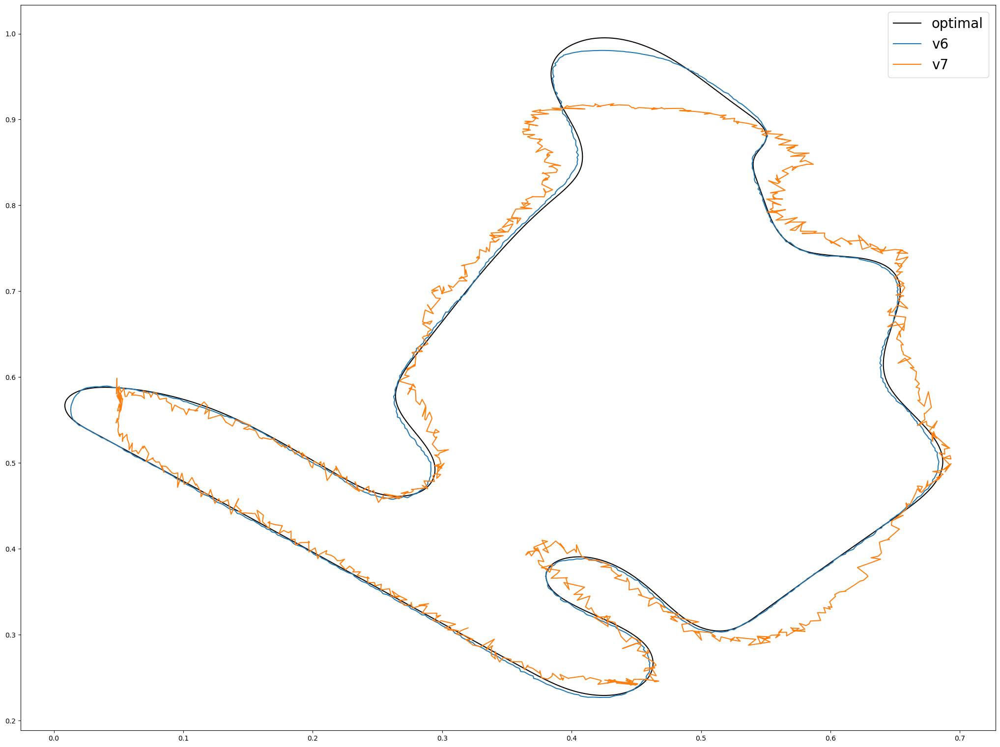

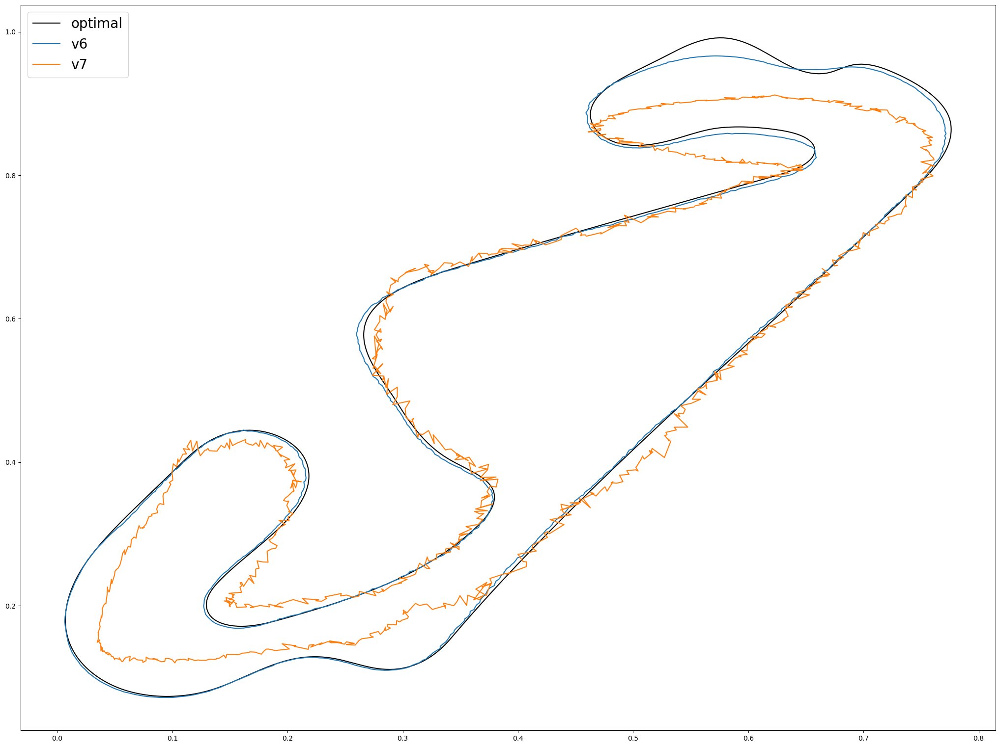

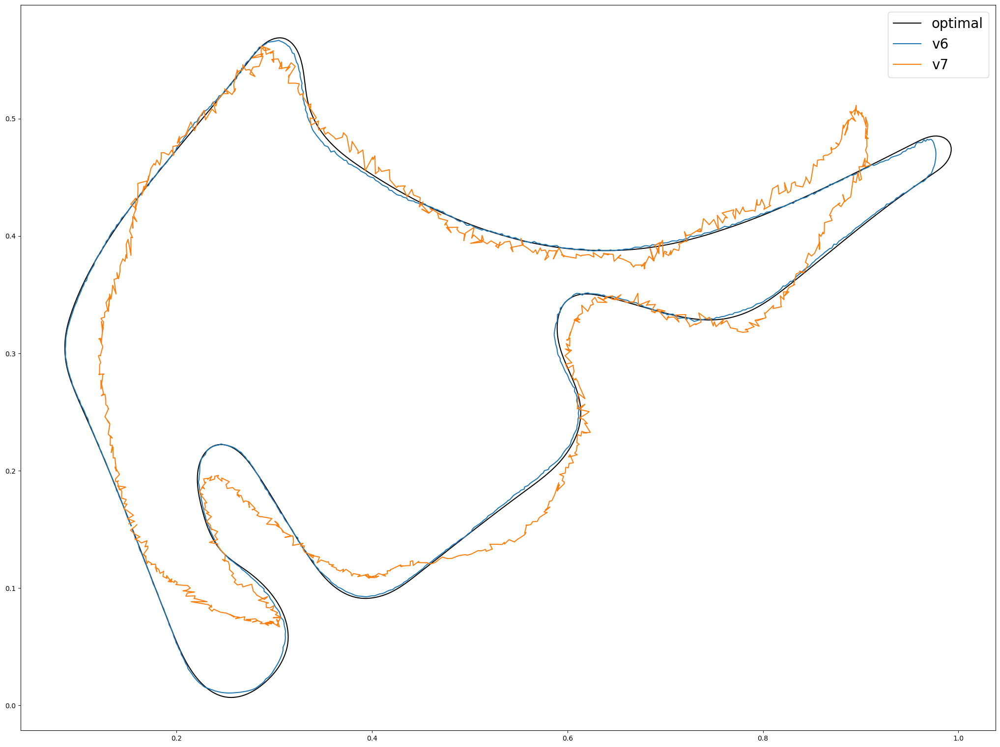

In [38]:
for n in [0,1,2,3,4]:
    result = [modelv6(np.array([dataset[n,0:4]])),
              modelv7(np.array([dataset[n,0:4]]))]
    plt.figure(figsize=(6.4*4,4.8*4))
    for i in [4]:
            plt.plot(dataset[n,i],dataset[n,i+1],color = 'k')
    for j in [0,1]:
        plt.plot(result[j][0][0],result[j][0][1])
    plt.legend(["optimal","v6","v7","v8"],fontsize="20")
    #plt.clf()